# <center>COVID 19 ANALYSIS<center>

![title](COVID_19.jpg)

### INTRODUCTION
+ In Junary of 2020 initial report came about posible outbreak within China provincy of Hubei. Since then outbreake has developed through other Chinas provenices and now through most of the continents. While dataset we have is considered as underestimed in terms of numbers, these analysis will present the best guess in effort to describe spread and of the virus and its rates. 

In [1]:
%matplotlib inline
# Import dependencies
from datetime import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
import plotly.figure_factory as ff
from plotly import subplots
from plotly.subplots import make_subplots
import plotly.graph_objs as go
from datetime import date
from fbprophet import Prophet
import math

In [2]:
# Importing data
covid = pd.read_csv("C:\\Users\\slavi\\PycharmProjects\\Covid-19-Analysis\\data\\covid_19_clean_complete.csv")
covid.columns = ['STATE','COUNTRY','LAT','LONG','DATE','CONFIRMED','DEATH', 'RECOVERED']
covid['DATE'] = covid['DATE'].apply(pd.to_datetime).dt.normalize()
covid.head()

,STATE,COUNTRY,LAT,LONG,DATE,CONFIRMED,DEATH,RECOVERED
0,Anhui,Mainland China,31.8257,117.2264,2020-01-22,1,0,0
1,Beijing,Mainland China,40.1824,116.4142,2020-01-22,14,0,0
2,Chongqing,Mainland China,30.0572,107.8740,2020-01-22,6,0,0
3,Fujian,Mainland China,26.0789,117.9874,2020-01-22,1,0,0
4,Gansu,Mainland China,36.0611,103.8343,2020-01-22,0,0,0


## ALL DATA ANALYSIS
+ In this section we will perform analysis on entire data set across all countries and all periods of time for confirmed, death and recovered cases.

#### Summary as of today

In [3]:
# Produce quick summary with total numbers
summary_all = covid.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
summary = summary_all.sort_values('DATE', ascending=False)
summary.head(1).style.background_gradient(cmap='OrRd')


c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
40,2020-03-02 00:00:00,90313,3085,45604


In [4]:
# Spread, death and recovered over the time outside of MainLand China
#covid_all =  covid[(covid['COUNTRY'] == 'Mainland China')]
#covid_all = covid_all.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
covid_all = summary_all[summary_all['DATE'] > '2020-01-22']

fig = make_subplots(rows=1, cols=3, subplot_titles=(f"{int(covid_all.CONFIRMED.max()):,d}" +' ' + "CONFIRMED",
                                                    f"{int(covid_all.DEATH.max()):,d}" +' ' + "DEATHS",
                                                    f"{int(covid_all.RECOVERED.max()):,d}" +' ' + "RECOVERED"))

trace1 = go.Scatter(
                x=covid_all['DATE'],
                y=covid_all['CONFIRMED'],
                name="CONFIRMED",
                line_color='orange',
                opacity=0.8)
trace2 = go.Scatter(
                x=covid_all['DATE'],
                y=covid_all['DEATH'],
                name="DEATH",
                line_color='dimgray',
                opacity=0.8)

trace3 = go.Scatter(
                x=covid_all['DATE'],
                y=covid_all['RECOVERED'],
                name="RECOVERED",
                line_color='deepskyblue',
                opacity=0.8)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)
fig.update_layout(template="ggplot2",title_text = '<b>Spread Vs. Death Vs Recovered around the world </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=False)
fig.show()

#### Daily reported numbers
+ Based on analysis below we see that numbers reported on daily basis fluctuate from day with few extremes. 
+ The highest number of infected cases reported in one day is 15,148, where on average we have ~2,552. 
+ the highest number of death reported in single day is 253, where on average is reported ~76 per day. 

In [5]:
# Producing daily data difference for Confirmed, Death, Recovered
sum_d = covid.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
sum_d = sum_d.sort_values('DATE', ascending=True)
sum_d = pd.DataFrame(sum_d.set_index('DATE').diff()).reset_index()
#sum_d = pd.DataFrame(round(sum_d.set_index('DATE').pct_change()*100)).reset_index()
sum_d = sum_d[sum_d['DATE'] > '2020-01-22']
sum_d.head()

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
1,2020-01-23,98.0,1.0,2.0
2,2020-01-24,288.0,8.0,6.0
3,2020-01-25,493.0,16.0,3.0
4,2020-01-26,684.0,14.0,13.0
5,2020-01-27,809.0,26.0,9.0


In [6]:
# Describing daily data set
sum_d.describe()

,CONFIRMED,DEATH,RECOVERED
count,40.000000,40.000000,40.000000
mean,2243.950000,76.700000,1139.400000
std,2500.260006,56.579964,1159.658389
min,98.000000,1.000000,2.000000
25%,674.000000,41.000000,133.000000
50%,1916.500000,69.500000,665.000000
75%,2670.500000,103.250000,1785.000000
max,15148.000000,253.000000,3996.000000


In [7]:
# Ploting daily updtes for 
fig_d = go.Figure()
fig_d.add_trace(go.Scatter(x=sum_d.DATE, y=sum_d.CONFIRMED, mode="lines+markers", name=f"MAX. OF {int(sum_d.CONFIRMED.max()):,d}" + ' ' + "CONFIRMED",line_color='Orange'))
fig_d.add_trace(go.Scatter(x=sum_d.DATE, y=sum_d.RECOVERED, mode="lines+markers", name=f"MAX. OF {int(sum_d.RECOVERED.max()):,d}" + ' ' + "RECOVERED",line_color='deepskyblue'))
fig_d.add_trace(go.Scatter(x=sum_d.DATE, y=sum_d.DEATH, mode="lines+markers", name=f"MAX. OF {int(sum_d.DEATH.max()):,d}" + ' ' + "DEATHS",line_color='dimgray'))
fig_d.update_layout(template="ggplot2",title_text = '<b>Daily numbers for Confirmed, Death and Recovered </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_d.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="dimgray",
        borderwidth=2
    ))
fig_d.show()

#### Percent of infection based on population - Analysis in progress

In [8]:
# Adding population values for percent of infection analysis
population = {
    "China": 1405232589,
    "Hubei": 59783978,
    "Guizhou": 35669112,
    "South Korea": 51272496,
    "Japan": 125411761,
    "Hong Kong": 7558987,
    "Italy": 59813122,
    "Iran": 83452905,
    "US" : 330356363
}
df = pd.DataFrame([population])
df.head()

,China,Hubei,Guizhou,South Korea,Japan,Hong Kong,Italy,Iran,US
0,1405232589,59783978,35669112,51272496,125411761,7558987,59813122,83452905,330356363


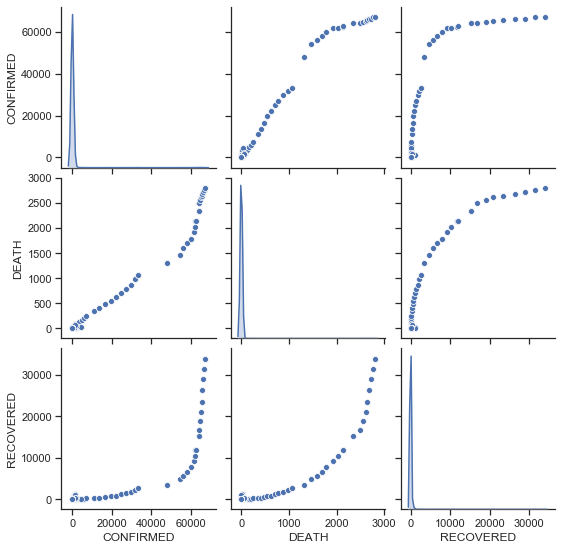

In [9]:
import seaborn as sns; sns.set(style="ticks", color_codes=True)
g = sns.pairplot(covid,vars=["CONFIRMED", "DEATH","RECOVERED"], diag_kind="kde")


#### Overall Death Percent
+ In order to calculate true death rate, we have to work only with cases that are conlcuded ether recovered or passed away. Deviding number of dead with total onfirmed cases is not accruate since we do not know the outcome of all cases that are still in process. Instead, this would make more sense: death/(death+recovered).

In [10]:
# Death rate analysis on global level
D_vs_R = covid.copy()
D_vs_R['REC'] = 'REC'
D_vs_R['DTH'] = 'DTH'
recovered = pd.pivot_table(D_vs_R.dropna(subset=['RECOVERED']), index='DATE', 
                         columns='REC', values='RECOVERED', aggfunc=np.sum).fillna(method='ffill').reset_index()

death = pd.pivot_table(D_vs_R.dropna(subset=['DEATH']), index='DATE', 
                         columns='DTH', values='DEATH', aggfunc=np.sum).fillna(method='ffill').reset_index()

D_vs_R_df = pd.merge(recovered,death,on='DATE')
D_vs_R_df['RATIO'] = round(D_vs_R_df['DTH'] / (D_vs_R_df['DTH'] + D_vs_R_df['REC'])*100)
D_vs_R_df.head()



,DATE,REC,DTH,RATIO
0,2020-01-22,28,17,38.0
1,2020-01-23,30,18,38.0
2,2020-01-24,36,26,42.0
3,2020-01-25,39,42,52.0
4,2020-01-26,52,56,52.0


+ Based on these analysis we see that initailly deathrate reached out up to 57% which is most likely due to quicker fatality than recovery rate since individuals in critical condition could pass away within first 7 days while it take several week to recover. 

In [11]:
# ploting Current Deat Rate around the world
cur_ratio = D_vs_R_df[D_vs_R_df['DATE'] == D_vs_R_df['DATE'].max()]
fig_dr = go.Figure()
fig_dr.add_trace(go.Scatter(x=D_vs_R_df.DATE, y=D_vs_R_df.RATIO, mode="lines+markers", line_color='Red', name = 'Current Death Rate' + ' ' + f"{int(cur_ratio['RATIO']):,d}%"))
fig_dr.update_layout(template="ggplot2",title_text = '<b>Death Rate % Around The World </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans", color='black'), showlegend=True) 
fig_dr.update_layout(
    legend=dict(
        x=.65,
        y=0.95,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Red",
        borderwidth=2
    ))
fig_dr.show()



#### Confirmed Vs. Recovered Vs Death case around the world

In [12]:
# Spread, death and recovered over the time around the world
covid_all = covid.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
covid_all= covid_all[covid_all['DATE'] > '2020-01-22']

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [13]:

# Plotting Values for Confirmed, deaths and reocvered cases
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"colspan": 2}, None],[{}, {}]],
    subplot_titles=(f"{int(covid_all.CONFIRMED.max()):,d}" +' ' + "CONFIRMED",
                    f"{int(covid_all.RECOVERED.max()):,d}" +' ' +"RECOVERED",
                    f"{int(covid_all.DEATH.max()):,d}" +' ' +"DEATHS"))

fig.add_trace(go.Bar(x=covid_all['DATE'], y=covid_all['CONFIRMED'], text = covid_all['CONFIRMED'],
                     marker_color='Orange'), row=1, col=1)

fig.add_trace(go.Bar(x=covid_all['DATE'], y=covid_all['RECOVERED'], marker_color='Green'), row=2, col=1)

fig.add_trace(go.Bar(x=covid_all['DATE'], y=covid_all['DEATH'], marker_color='Red'), row=2, col=2)

fig.update_traces(marker_line_color='rgb(8,48,107)',marker_line_width=1.5, opacity=0.8,
                  texttemplate='%{text:.2s}', textposition='outside')

fig['layout']['yaxis1'].update(title='Count', range=[0, covid_all['CONFIRMED'].max() + 15000])
fig['layout']['yaxis2'].update(title='Count', range=[0, covid_all['RECOVERED'].max() + 10000])
fig['layout']['yaxis3'].update(title='Count', range=[0, covid_all['DEATH'].max() + 1000])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')

fig.update_layout(template="ggplot2",title_text = '<b>CurrentConfirmed Vs. Death Vs Recovered Around The World </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=False)
fig.show()

#### Outbreak Forecasting with fbProphete
+ Using fbProphet algorythm we will atempt to predict total number of cases around the world in next 7 days. We see that upper limit is around 116k where lower end is at 103k.


In [14]:
#Runing fbprophet algorythm on confirmed cases outside of MainLand China. Forecasting 7 days.
covid_nc =  covid.copy()
all_df = covid.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
all_df = all_df[all_df['DATE'] > '2020-01-22']

df_prophet = all_df.loc[:,["DATE", 'CONFIRMED']]
df_prophet.columns = ['ds','y']
m_d = Prophet(
    yearly_seasonality=False,
    weekly_seasonality = False,
    daily_seasonality = False,
    seasonality_mode = 'additive')
m_d.fit(df_prophet)
future_d = m_d.make_future_dataframe(periods=7)
fcst_daily = m_d.predict(future_d)
fcst_daily[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,ds,yhat,yhat_lower,yhat_upper
42,2020-03-05,100562.167328,94068.955330,106962.851556
43,2020-03-06,102625.895590,96278.742711,109056.401308
44,2020-03-07,104689.623852,98136.257529,110576.483225
45,2020-03-08,106753.352114,100517.987930,112940.751356
46,2020-03-09,108817.080376,102570.017751,114974.115208


In [15]:
# Plotting the predictions
fig_prpht = go.Figure()
trace1 = {
  "fill": None, 
  "mode": "markers",
  "marker_size": 10,
  "name": "Confirmed", 
  "type": "scatter", 
  "x": df_prophet.ds, 
  "y": df_prophet.y
}
trace2 = {
  "fill": "tonexty", 
  "line": {"color": "red"}, 
  "mode": "lines", 
  "name": "upper_band", 
  "type": "scatter", 
  "x": fcst_daily.ds, 
  "y": fcst_daily.yhat_upper
}
trace3 = {
  "fill": "tonexty", 
  "line": {"color": "dimgray"}, 
  "mode": "lines", 
  "name": "lower_band", 
  "type": "scatter", 
  "x": fcst_daily.ds, 
  "y": fcst_daily.yhat_lower
}
trace4 = {
  "line": {"color": "blue"}, 
  "mode": "lines+markers",
  "marker_size": 4,
  "name": "prediction", 
  "type": "scatter", 
  "x": fcst_daily.ds, 
  "y": fcst_daily.yhat
}
data = [trace1, trace2, trace3, trace4]
layout = {
  "title": "Confirmed Cases Time Series", 
  "xaxis": {
      "title": "Dates", 
    "ticklen": 5, 
    "gridcolor": "rgb(255, 255, 255)", 
    "gridwidth": 2, 
    "zerolinewidth": 1
  }, 
  "yaxis": {
    "title": "Confirmed Cases", 
    "ticklen": 5, 
    "gridcolor": "rgb(255, 255, 255)", 
    "gridwidth": 2, 
    "zerolinewidth": 1
  }, 
}
fig_prpht = go.Figure(data=data, layout=layout)
fig_prpht.update_layout(template="ggplot2",title_text = '<b>Forecastng of spread around the world </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_prpht.update_layout(
    legend=dict(
        x=0.01,
        y=.99,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Orange",
        borderwidth=2
    ))
fig_prpht.show()

#### Plotting Cases On Map

In [16]:
# Ploting cases on world map
import folium

map = folium.Map(location=[30, 30], tiles = "openstreetmap", zoom_start=2.2)
for i in range(0,len(covid)):
    folium.Circle(location=[covid.iloc[i]['LAT'],
                            covid.iloc[i]['LONG']],
                            radius=(math.sqrt(covid.iloc[i]['CONFIRMED'])*4000 ),
                            color='crimson',
                            fill=True,
                            fill_color='crimson').add_to(map)
map

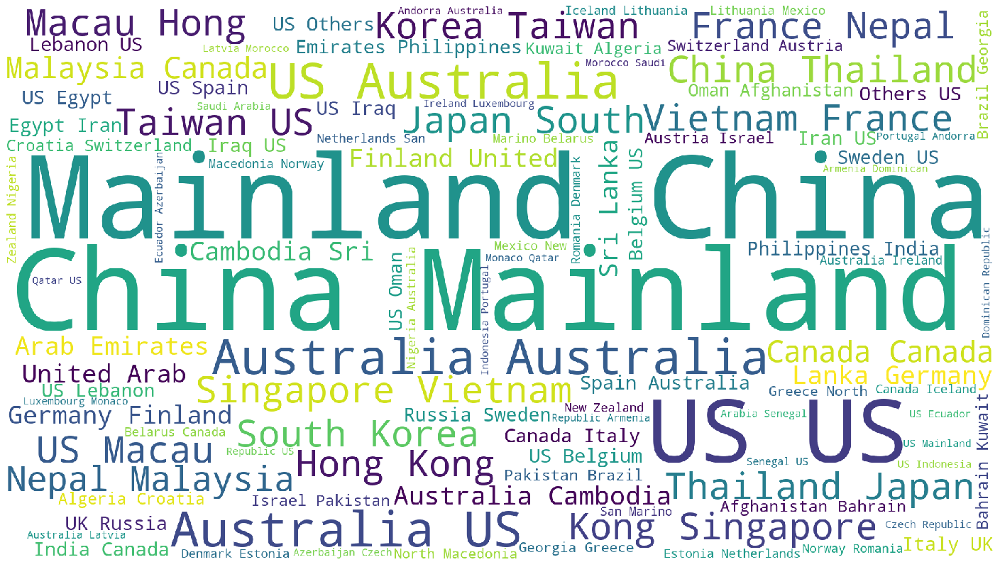

In [17]:
# Exploring word cloud based on STATE value
from wordcloud import WordCloud
plt.subplots(figsize=(25,15))
wordcloud = WordCloud(background_color='white',
                          width=1920,
                          height=1080
                         ).generate(" ".join(covid.COUNTRY))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('country.png')
plt.show()

## ANALYSIS ON CHINA
+ This analysis is conducted on subset od observations that comes from China


#### Summary As Of Today

In [18]:
# Produce quick summary for China with total numbers
covid_ch =  covid[(covid['COUNTRY'] == 'Mainland China')]
ch_df = covid_ch.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()

summary_ch = ch_df.sort_values('DATE', ascending=False)
summary_ch.head(1).style.background_gradient(cmap='OrRd')

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
40,2020-03-02 00:00:00,80026,2912,44810


#### Confirmed Vs. Recovered Vs Death in Mainland China

In [19]:
# Spread, death and recovered over the time outside of MainLand China
#covid_ch =  covid[(covid['COUNTRY'] == 'Mainland China')]
#ch_df = covid_ch.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
ch_df = ch_df[ch_df['DATE'] > '2020-01-22']

fig = make_subplots(rows=1, cols=3, subplot_titles=(f"{int(ch_df.CONFIRMED.max()):,d}" +' ' + "CONFIRMED",
                                                    f"{int(ch_df.DEATH.max()):,d}" +' ' + "DEATHS",
                                                    f"{int(ch_df.RECOVERED.max()):,d}" +' ' + "RECOVERED"))

trace1 = go.Scatter(
                x=ch_df['DATE'],
                y=ch_df['CONFIRMED'],
                name="CONFIRMED",
                line_color='orange',
                opacity=0.8)
trace2 = go.Scatter(
                x=ch_df['DATE'],
                y=ch_df['DEATH'],
                name="DEATH",
                line_color='dimgray',
                opacity=0.8)

trace3 = go.Scatter(
                x=ch_df['DATE'],
                y=ch_df['RECOVERED'],
                name="RECOVERED",
                line_color='deepskyblue',
                opacity=0.8)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)
fig.update_layout(template="ggplot2",title_text = '<b>Spread Vs. Death Vs Recovered within Mainland China </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=False)
fig.show()

#### Daily reported numbers in China

In [20]:
# Producing daily data difference for Confirmed, Death, Recovered
sum_cd = covid.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
sum_cd = sum_cd.sort_values('DATE', ascending=True)
sum_cd = pd.DataFrame(sum_cd.set_index('DATE').diff()).reset_index()
#sum_d = pd.DataFrame(round(sum_d.set_index('DATE').pct_change()*100)).reset_index()
sum_cd = sum_cd[sum_cd['DATE'] > '2020-01-22']
sum_cd.head()

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
1,2020-01-23,98.0,1.0,2.0
2,2020-01-24,288.0,8.0,6.0
3,2020-01-25,493.0,16.0,3.0
4,2020-01-26,684.0,14.0,13.0
5,2020-01-27,809.0,26.0,9.0


In [21]:
# Ploting daily updtes for 
fig_d = go.Figure()
fig_d.add_trace(go.Scatter(x=sum_cd.DATE, y=sum_cd.CONFIRMED, mode="lines+markers", name=f"MAX. OF {int(sum_cd.CONFIRMED.max()):,d}" + ' ' + "CONFIRMED",line_color='Orange'))
fig_d.add_trace(go.Scatter(x=sum_cd.DATE, y=sum_cd.RECOVERED, mode="lines+markers", name=f"MAX. OF {int(sum_cd.RECOVERED.max()):,d}" + ' ' + "RECOVERED",line_color='deepskyblue'))
fig_d.add_trace(go.Scatter(x=sum_cd.DATE, y=sum_cd.DEATH, mode="lines+markers", name=f"MAX. OF {int(sum_cd.DEATH.max()):,d}" + ' ' + "DEATHS",line_color='dimgray'))
fig_d.update_layout(template="ggplot2",title_text = '<b>Daily numbers for Confirmed, Death and Recovered </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_d.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="dimgray",
        borderwidth=2
    ))
fig_d.show()

#### Death Rate in China
+ Based on analysis below, we can see that China drives the percent of death rate due to amouth of cases reported from that region of the world. 

In [22]:
# Death rate analysis on global level
china_drr = covid[(covid['COUNTRY'] == 'Mainland China')]
china_drr['REC'] = 'REC'
china_drr['DTH'] = 'DTH'
ch_recovered = pd.pivot_table(china_drr.dropna(subset=['RECOVERED']), index='DATE', 
                         columns='REC', values='RECOVERED', aggfunc=np.sum).fillna(method='ffill').reset_index()

ch_death = pd.pivot_table(china_drr.dropna(subset=['DEATH']), index='DATE', 
                         columns='DTH', values='DEATH', aggfunc=np.sum).fillna(method='ffill').reset_index()
china_drr_df = pd.merge(ch_recovered,ch_death,on='DATE')
china_drr_df['RATIO'] = round(china_drr_df['DTH'] / (china_drr_df['DTH'] + china_drr_df['REC'])*100)
china_drr_df.head()

cur_ch_ratio = china_drr_df[china_drr_df['DATE'] == china_drr_df['DATE'].max()]
# ploting Current Deat Rate around the world
fig_dr = go.Figure()
fig_dr.add_trace(go.Scatter(x=china_drr_df.DATE, y=china_drr_df.RATIO, mode="lines+markers", line_color='Red', name = 'Current Death Rate' + ' ' + f"{int(cur_ch_ratio['RATIO']):,d}%"))
fig_dr.update_layout(template="ggplot2",title_text = '<b>Death Rate % In Mainland China </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans", color='black'), showlegend=True) 
fig_dr.update_layout(
    legend=dict(
        x=.65,
        y=0.95,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Red",
        borderwidth=2
    ))
fig_dr.show()

#### Distribution of cases in Chinas provincies

In [23]:
# Isolating the max values based on last date for china
china_cur  = covid[(covid['COUNTRY'] == 'Mainland China')]
china_cur_st = china_cur[china_cur['DATE'] == china_cur['DATE'].max()]
china_cur_st = china_cur_st.groupby('STATE')['CONFIRMED','DEATH','RECOVERED'].sum().reset_index()
china_cur_st.head()

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,STATE,CONFIRMED,DEATH,RECOVERED
0,Anhui,990,6,917
1,Beijing,414,8,282
2,Chongqing,576,6,469
3,Fujian,296,1,255
4,Gansu,91,2,85


In [24]:
# Ploting distribution between provinces in China
fig = px.treemap(china_cur_st.sort_values(by='CONFIRMED', ascending=False).reset_index(drop=True), 
                 path=["STATE"], values="CONFIRMED", 
                 title='Number of Confirmed Cases in US Cities',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.update_layout(template="ggplot2",title_text = '<b>Current confirmed cases within China`s Provincies </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig.show()


#### Ploting locations of confirmed cases on map

In [25]:
# Ploting Cases in China
map = folium.Map(location=[30, 100], tiles = "CartoDB dark_matter", zoom_start=3.5)
for i in range(0,len(china_drr)):
    folium.Circle(location=[china_drr.iloc[i]['LAT'],
                            china_drr.iloc[i]['LONG']],
                            radius=(math.sqrt(china_drr.iloc[i]['CONFIRMED'])*1000),
                            color='crimson',
                            fill=True,
                            fill_color='crimson').add_to(map)
map

## ANALYSIS OUTSIDE OF CHINA

#### Summary As Of Today Outside China

In [26]:
# Produce quick summary for China with total numbers
covid_oc =  covid[(covid['COUNTRY'] != 'Mainland China')]
sotoc = covid_oc.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()

sotoc_d = sotoc.sort_values('DATE', ascending=False)
sotoc_d.head(1).style.background_gradient(cmap='OrRd')

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
40,2020-03-02 00:00:00,10287,173,794


In [27]:
# Spread, death and recovered over the time outside of MainLand China
sotoc = sotoc[sotoc['DATE'] > '2020-01-22']

fig = make_subplots(rows=1, cols=3, subplot_titles=(f"{int(sotoc.CONFIRMED.max()):,d}" +' ' + "CONFIRMED",
                                                    f"{int(sotoc.DEATH.max()):,d}" +' ' + "DEATHS",
                                                    f"{int(sotoc.RECOVERED.max()):,d}" +' ' + "RECOVERED"))

trace1 = go.Scatter(
                x=sotoc['DATE'],
                y=sotoc['CONFIRMED'],
                name="CONFIRMED",
                line_color='orange',
                opacity=0.8)
trace2 = go.Scatter(
                x=sotoc['DATE'],
                y=sotoc['DEATH'],
                name="DEATH",
                line_color='dimgray',
                opacity=0.8)

trace3 = go.Scatter(
                x=sotoc['DATE'],
                y=sotoc['RECOVERED'],
                name="RECOVERED",
                line_color='deepskyblue',
                opacity=0.8)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)
fig.update_layout(template="ggplot2",title_text = '<b>Spread Vs. Death Vs Recovered outside Chine </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=False)
fig.show()


#### Daily Reported Numbers

In [28]:
# Producing daily data difference for Confirmed, Death, Recovered
#sum_ocd = covid.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
sum_ocd = sotoc.sort_values('DATE', ascending=True)
sum_ocd = pd.DataFrame(sum_ocd.set_index('DATE').diff()).reset_index()
#sum_d = pd.DataFrame(round(sum_d.set_index('DATE').pct_change()*100)).reset_index()
sum_ocd = sum_ocd[sum_ocd['DATE'] > '2020-01-22']
sum_ocd.head()

,DATE,CONFIRMED,DEATH,RECOVERED
0,2020-01-23,NaN,NaN,NaN
1,2020-01-24,11.0,0.0,0.0
2,2020-01-25,10.0,0.0,0.0
3,2020-01-26,21.0,0.0,3.0
4,2020-01-27,8.0,0.0,0.0


In [29]:
# Ploting daily updtes for 
fig_d = go.Figure()
fig_d.add_trace(go.Scatter(x=sum_ocd.DATE, y=sum_ocd.CONFIRMED, mode="lines+markers", name=f"MAX. OF {int(sum_ocd.CONFIRMED.max()):,d}" + ' ' + "CONFIRMED",line_color='Orange'))
fig_d.add_trace(go.Scatter(x=sum_ocd.DATE, y=sum_ocd.RECOVERED, mode="lines+markers", name=f"MAX. OF {int(sum_ocd.RECOVERED.max()):,d}" + ' ' + "RECOVERED",line_color='deepskyblue'))
fig_d.add_trace(go.Scatter(x=sum_ocd.DATE, y=sum_ocd.DEATH, mode="lines+markers", name=f"MAX. OF {int(sum_ocd.DEATH.max()):,d}" + ' ' + "DEATHS",line_color='dimgray'))
fig_d.update_layout(template="ggplot2",title_text = '<b>Daily numbers for Confirmed, Death and Recovered Outside of China </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_d.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="dimgray",
        borderwidth=2
    ))
fig_d.show()

#### Death rate by Country outside of Mainland China
+ Using previous logic to calculate death ratio per country, we see that at the beginig of outbrake death rate is much higher because there is lag of week or two between death and recovered. It seems that death apears within first week or two and while individuals taking 3 or more weeks to recover. 
+ If the coutnry did not report any recovered cases while reported death cases, the death rate will be 100% at that moment since we still dont know the outcome of all cases. 

In [30]:
# Death rate analysis on global level
oc_drr = covid[(covid['COUNTRY'] != 'Mainland China')]
oc_drr['REC'] = 'REC'
oc_drr['DTH'] = 'DTH'
oc_recovered = pd.pivot_table(oc_drr.dropna(subset=['RECOVERED']), index='DATE', 
                         columns='REC', values='RECOVERED', aggfunc=np.sum).fillna(method='ffill').reset_index()

oc_death = pd.pivot_table(oc_drr.dropna(subset=['DEATH']), index='DATE', 
                         columns='DTH', values='DEATH', aggfunc=np.sum).fillna(method='ffill').reset_index()
oc_drr_df = pd.merge(oc_recovered,oc_death,on='DATE')
oc_drr_df['RATIO'] = round(oc_drr_df['DTH'] / (oc_drr_df['DTH'] + oc_drr_df['REC'])*100)

oc_ratio = oc_drr_df[oc_drr_df['DATE'] == oc_drr_df['DATE'].max()]
# ploting Current Deat Rate around the world
fig_dr = go.Figure()
fig_dr.add_trace(go.Scatter(x=oc_drr_df.DATE, y=oc_drr_df.RATIO, mode="lines+markers", line_color='Red', name = 'Current Death Rate' + ' ' + f"{int(oc_ratio['RATIO']):,d}%"))
fig_dr.update_layout(template="ggplot2",title_text = '<b>Death Rate % outside Mainland China </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans", color='black'), showlegend=True) 
fig_dr.update_layout(
    legend=dict(
        x=.02,
        y=0.95,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Red",
        borderwidth=2
    ))
fig_dr.show()


In [31]:
# Death rate analysis by country
oc_dr_s = covid[(covid['COUNTRY'] != 'Mainland China')]
oc_dr_s = oc_dr_s[oc_dr_s['DATE'] == oc_dr_s['DATE'].max()]
oc_dr_s = oc_dr_s.groupby('COUNTRY')['CONFIRMED','DEATH','RECOVERED'].sum().reset_index()
oc_dr_s['RATIO'] = round(oc_dr_s['DEATH'] / (oc_dr_s['DEATH'] + oc_dr_s['RECOVERED'])*100)

# Ploting confirmed cased outside of Mainland China
oc_dr_s= oc_dr_s.sort_values(by='RATIO', ascending= False)
fig = go.Figure()
fig.add_trace(go.Bar(x=oc_dr_s.COUNTRY,
                     y=oc_dr_s.RATIO,            
                     opacity=0.8,
                     text = oc_dr_s.RATIO,
                     textposition='outside',
                     marker={'color':'orange'}))
fig.update_layout(title={'text': 'Countries outside of MainLand China with their current death rate',
                         'y':0.95, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
                         showlegend=False, xaxis_title_text='Country',
                         yaxis_title_text='Count', bargap=0.3)
fig.update_yaxes(range = [0, oc_dr_s['RATIO'].max() + 10])
fig.update_traces(marker_color='Red', marker_line_color='orange',
                  marker_line_width=1, opacity=0.6   )
fig.update_layout(uniformtext_minsize=7, uniformtext_mode='hide')
fig.show()


c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



#### Recovery Rate by coutry outside Mainland China
+ Based on analysis below there is several countries who successfully recovering their infected cases with no death reported so far. 


In [32]:
# Death rate analysis by country
oc_drr_s = covid[(covid['COUNTRY'] != 'Mainland China')]
oc_drr_s = oc_drr_s[oc_drr_s['DATE'] == oc_drr_s['DATE'].max()]
oc_drr_s = oc_drr_s.groupby('COUNTRY')['CONFIRMED','DEATH','RECOVERED'].sum().reset_index()
oc_drr_s['RATIO'] = round(oc_drr_s['RECOVERED'] / (oc_drr_s['DEATH'] + oc_drr_s['RECOVERED'])*100)

# Ploting confirmed cased outside of Mainland China
oc_drr_s= oc_drr_s.sort_values(by='RATIO', ascending= False)
fig = go.Figure()
fig.add_trace(go.Bar(x=oc_drr_s.COUNTRY,
                     y=oc_drr_s.RATIO,            
                     opacity=0.8,
                     text = oc_drr_s.RATIO,
                     textposition='outside',
                     marker={'color':'orange'}))
fig.update_layout(title={'text': 'Countries outside of MainLand China With Their Current recovery rate',
                         'y':0.95, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'},
                         showlegend=False, xaxis_title_text='Country',
                         yaxis_title_text='Count', bargap=0.3)
fig.update_yaxes(range = [0, oc_drr_s['RATIO'].max() + 10])
fig.update_traces(marker_color='green', marker_line_color='orange',
                  marker_line_width=1, opacity=0.6)
fig.update_layout(uniformtext_minsize=6, uniformtext_mode='show')
fig.show()

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



#### Breakdown by country

In [33]:
# Isolating the max values based on last date for china
ooc  = covid[(covid['COUNTRY'] != 'Mainland China')]
ooc_df = ooc[ooc['DATE'] == ooc['DATE'].max()]
ooc_df = ooc_df.groupby('COUNTRY')['CONFIRMED','DEATH','RECOVERED'].sum().reset_index()
ooc_df

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,COUNTRY,CONFIRMED,DEATH,RECOVERED
0,Afghanistan,1,0,0
1,Algeria,3,0,0
2,Andorra,1,0,0
3,Armenia,1,0,0
4,Australia,30,1,11
...,...,...,...,...
69,Thailand,43,1,31
70,UK,40,0,8
71,US,105,6,9
72,United Arab Emirates,21,0,5


In [34]:
# breakdown by state with heat map
import plotly.express as px
ooc_pl = ooc_df.sort_values(by='CONFIRMED', ascending=True).reset_index(drop=True)
fig = px.bar(ooc_pl, x='COUNTRY', y='CONFIRMED',
             hover_data=['COUNTRY', 'CONFIRMED'], color='CONFIRMED',text = ooc_pl.CONFIRMED,
             labels={'pop':'Confirmed Cases in US'}, height=600)
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
fig.update_layout(uniformtext_minsize=5, uniformtext_mode='hide')
fig.show()


In [35]:
# Display number of confirmed cased outside of MainLand China
fig_conf = go.Figure()
fig_conf.add_trace(go.Scatter(x=sotoc.DATE, y=sotoc.CONFIRMED, mode="lines+markers", line_color='Orange', name = f"{int(sotoc.CONFIRMED.max()):,d}" + ' ' + 'Confirmed'))
fig_conf.update_layout(template="ggplot2",title_text = '<b>Confiermed cases outside of MainLand China </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans", color='black'), showlegend=True) 
fig_conf.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Orange",
        borderwidth=2
    ))
fig_conf.show()

In [36]:
# Display Recover vs Deaths outside of MainLand China
fig_rd = go.Figure()
fig_rd.add_trace(go.Scatter(x=sotoc.DATE, y=sotoc.RECOVERED, mode="lines+markers", name=f"{int(sotoc.RECOVERED.max()):,d}" + ' ' + "RECOVERED",line_color='deepskyblue'))
fig_rd.add_trace(go.Scatter(x=sotoc.DATE, y=sotoc.DEATH, mode="lines+markers", name=f"{int(sotoc.DEATH.max()):,d}" + ' ' + "DEATHS",line_color='dimgray'))
fig_rd.update_layout(template="ggplot2",title_text = '<b>Recovered Vs Death outside of MainLand China </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_rd.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="dimgray",
        borderwidth=2
    ))
fig_rd.show()


## ANALYSIS ON US

#### Summary As Of Today for US

In [37]:
# Breaking up by state
us_cur = covid[(covid['COUNTRY'] == 'US')]
us_cur_st = us_cur[us_cur['DATE'] == us_cur['DATE'].max()]
us_cur_st.head(52)

,STATE,COUNTRY,LAT,LONG,DATE,CONFIRMED,DEATH,RECOVERED
5715,"King County, WA",US,47.6062,-122.3321,2020-03-02,14,5,1
5716,"Cook County, IL",US,41.8781,-87.6298,2020-03-02,4,0,2
5717,"Tempe, AZ",US,33.4255,-111.9400,2020-03-02,1,0,1
5727,"Orange, CA",US,33.7879,-117.8531,2020-03-02,1,0,0
5728,"Los Angeles, CA",US,34.0522,-118.2437,2020-03-02,1,0,0
5744,"Santa Clara, CA",US,37.3541,-121.9552,2020-03-02,9,0,1
5747,"Boston, MA",US,42.3601,-71.0589,2020-03-02,1,0,1
5748,"San Benito, CA",US,36.5761,-120.9876,2020-03-02,2,0,0
5750,"Madison, WI",US,43.0731,-89.4012,2020-03-02,1,0,0
5752,"San Diego County, CA",US,32.7157,-117.1611,2020-03-02,2,0,1


In [38]:
# Produce quick summary for China with total numbers
covid_us =  covid[(covid['COUNTRY'] == 'US')]
covid_us = covid_us.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()

covid_us = covid_us.sort_values('DATE', ascending=False)
covid_us.head(1).style.background_gradient(cmap='OrRd')

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
40,2020-03-02 00:00:00,105,6,9


In [39]:
# Spread, death and recovered over the time for US
us_cur = us_cur.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()

fig = make_subplots(rows=1, cols=3, subplot_titles=(f"{int(us_cur.CONFIRMED.max()):,d}" +' ' + "CONFIRMED",
                                                    f"{int(us_cur.DEATH.max()):,d}" +' ' + "DEATHS",
                                                    f"{int(us_cur.RECOVERED.max()):,d}" +' ' + "RECOVERED"))

trace1 = go.Scatter(
                x=us_cur['DATE'],
                y=us_cur['CONFIRMED'],
                name="CONFIRMED",
                line_color='orange',
                opacity=0.8)
trace2 = go.Scatter(
                x=us_cur['DATE'],
                y=us_cur['DEATH'],
                name="DEATH",
                line_color='dimgray',
                opacity=0.8)

trace3 = go.Scatter(
                x=us_cur['DATE'],
                y=us_cur['RECOVERED'],
                name="RECOVERED",
                line_color='deepskyblue',
                opacity=0.8)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)
fig.update_layout(template="ggplot2",title_text = '<b>Spread Vs. Death Vs Recovered in US </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=False)
fig.show()

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



#### Daily Reported Number By US

In [40]:
# Producing daily data difference for Confirmed, Death, Recovered

sum_us = covid_us.sort_values('DATE', ascending=True)
sum_us = pd.DataFrame(sum_us.set_index('DATE').diff()).reset_index()
#sum_d = pd.DataFrame(round(sum_d.set_index('DATE').pct_change()*100)).reset_index()
sum_us = sum_us[sum_us['DATE'] > '2020-01-22']
sum_us.head()

,DATE,CONFIRMED,DEATH,RECOVERED
1,2020-01-23,0.0,0.0,0.0
2,2020-01-24,1.0,0.0,0.0
3,2020-01-25,0.0,0.0,0.0
4,2020-01-26,3.0,0.0,0.0
5,2020-01-27,0.0,0.0,0.0


In [41]:
# Ploting daily updtes for 
fig_d = go.Figure()
fig_d.add_trace(go.Scatter(x=sum_us.DATE, y=sum_us.CONFIRMED, mode="lines+markers", name=f"MAX. OF {int(sum_us.CONFIRMED.max()):,d}" + ' ' + "CONFIRMED",line_color='Orange'))
fig_d.add_trace(go.Scatter(x=sum_us.DATE, y=sum_us.RECOVERED, mode="lines+markers", name=f"MAX. OF {int(sum_us.RECOVERED.max()):,d}" + ' ' + "RECOVERED",line_color='deepskyblue'))
fig_d.add_trace(go.Scatter(x=sum_us.DATE, y=sum_us.DEATH, mode="lines+markers", name=f"MAX. OF {int(sum_us.DEATH.max()):,d}" + ' ' + "DEATHS",line_color='dimgray'))
fig_d.update_layout(template="ggplot2",title_text = '<b>Daily numbers for Confirmed, Death and Recovered in US </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_d.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="dimgray",
        borderwidth=2
    ))
fig_d.show()

#### Death Pecent In US

In [42]:
# Death rate analysis on global level
us_drr = covid[(covid['COUNTRY'] == 'US')]
us_drr['REC'] = 'REC'
us_drr['DTH'] = 'DTH'
us_recovered = pd.pivot_table(us_drr.dropna(subset=['RECOVERED']), index='DATE', 
                         columns='REC', values='RECOVERED', aggfunc=np.sum).fillna(method='ffill').reset_index()

us_death = pd.pivot_table(us_drr.dropna(subset=['DEATH']), index='DATE', 
                         columns='DTH', values='DEATH', aggfunc=np.sum).fillna(method='ffill').reset_index()
us_drr_df = pd.merge(us_recovered,us_death,on='DATE')
us_drr_df['RATIO'] = round(us_drr_df['DTH'] / (us_drr_df['DTH'] + us_drr_df['REC'])*100)

us_ratio = us_drr_df[us_drr_df['DATE'] == us_drr_df['DATE'].max()]
# ploting Current Deat Rate around the world
fig_us = go.Figure()
fig_us.add_trace(go.Scatter(x=us_drr_df.DATE, y=us_drr_df.RATIO, mode="lines+markers", line_color='Red', name = 'Current Death Rate' + ' ' + f"{int(us_ratio['RATIO']):,d}%"))
fig_us.update_layout(template="ggplot2",title_text = '<b>Death Rate % in US</b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans", color='black'), showlegend=True) 
fig_us.update_layout(
    legend=dict(
        x=.02,
        y=0.95,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Red",
        borderwidth=2
    ))
fig_us.show()

In [43]:
# Plotting US data on map
map = folium.Map(location=[35, -100], tiles = "openstreetmap", zoom_start=4.4)
for i in range(0,len(us_drr)):
    folium.Circle(location=[us_drr.iloc[i]['LAT'],
                            us_drr.iloc[i]['LONG']],
                            radius=(math.sqrt(us_drr.iloc[i]['CONFIRMED'])*20000),
                            color='crimson',
                            fill=True,
                            fill_color='crimson').add_to(map)
folium.LayerControl().add_to(map)
map

In [44]:
# Analyzing US
us_cur = covid[(covid['COUNTRY'] == 'US')]
us_cur_st = us_cur[us_cur['DATE'] == us_cur['DATE'].max()]
us_cur_st = us_cur_st.groupby('STATE')['CONFIRMED','DEATH','RECOVERED'].sum().reset_index()

# Ploting the distribution of cases over the US
fig = px.treemap(us_cur_st.sort_values(by='CONFIRMED', ascending=False).reset_index(drop=True), 
                 path=["STATE"], values="CONFIRMED", 
                 title='Number of Confirmed Cases in US Cities',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.update_layout(template="ggplot2",title_text = '<b>Current breakdown of confirmed cases within US </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig.show()

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:4: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



#### Confirmed Vs. Recovered Vs. Death in US

## ANALYSIS ON ITALY

#### Summary As Of Today For Italy

In [45]:
# Runing data for summary on Italy as of now
italy_cur = covid[(covid['COUNTRY'] == 'Italy')]
italy_cur = italy_cur.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
summary_it = italy_cur.sort_values('DATE', ascending=False)
summary_it.head(1).style.background_gradient(cmap='OrRd')

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
40,2020-03-02 00:00:00,2036,52,149


In [46]:
# Spread, death and recovered over the time for Italy
fig = make_subplots(rows=1, cols=3, subplot_titles=(f"{int(italy_cur.CONFIRMED.max()):,d}" +' ' + "CONFIRMED",
                                                    f"{int(italy_cur.DEATH.max()):,d}" +' ' + "DEATHS",
                                                    f"{int(italy_cur.RECOVERED.max()):,d}" +' ' + "RECOVERED"))

trace1 = go.Scatter(
                x=italy_cur['DATE'],
                y=italy_cur['CONFIRMED'],
                name="CONFIRMED",
                line_color='orange',
                opacity=0.8)
trace2 = go.Scatter(
                x=italy_cur['DATE'],
                y=italy_cur['DEATH'],
                name="DEATH",
                line_color='dimgray',
                opacity=0.8)

trace3 = go.Scatter(
                x=italy_cur['DATE'],
                y=italy_cur['RECOVERED'],
                name="RECOVERED",
                line_color='deepskyblue',
                opacity=0.8)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)
fig.update_layout(template="ggplot2",title_text = '<b>Spread Vs. Death Vs Recovered in Italy </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=False)
fig.show()

#### Daily Reported Numbers By Italy

In [47]:
# Producing daily data difference for Confirmed, Death, Recovered

sum_it = italy_cur.sort_values('DATE', ascending=True)
sum_it = pd.DataFrame(sum_it.set_index('DATE').diff()).reset_index()
sum_it = sum_it[sum_it['DATE'] > '2020-01-22']
sum_it.head()

,DATE,CONFIRMED,DEATH,RECOVERED
1,2020-01-23,0.0,0.0,0.0
2,2020-01-24,0.0,0.0,0.0
3,2020-01-25,0.0,0.0,0.0
4,2020-01-26,0.0,0.0,0.0
5,2020-01-27,0.0,0.0,0.0


In [48]:
# Ploting daily updtes for 
fig_it = go.Figure()
fig_it.add_trace(go.Scatter(x=sum_it.DATE, y=sum_it.CONFIRMED, mode="lines+markers", name=f"MAX. OF {int(sum_it.CONFIRMED.max()):,d}" + ' ' + "CONFIRMED",line_color='Orange'))
fig_it.add_trace(go.Scatter(x=sum_it.DATE, y=sum_it.RECOVERED, mode="lines+markers", name=f"MAX. OF {int(sum_it.RECOVERED.max()):,d}" + ' ' + "RECOVERED",line_color='deepskyblue'))
fig_it.add_trace(go.Scatter(x=sum_it.DATE, y=sum_it.DEATH, mode="lines+markers", name=f"MAX. OF {int(sum_it.DEATH.max()):,d}" + ' ' + "DEATHS",line_color='dimgray'))
fig_it.update_layout(template="ggplot2",title_text = '<b>Daily numbers for Confirmed, Death and Recovered In Itally </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_it.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="dimgray",
        borderwidth=2
    ))
fig_it.show()

#### Death Percent For Italy

In [49]:
# Death rate analysis on global level
it_drr = covid[(covid['COUNTRY'] == 'Italy')]
it_drr['REC'] = 'REC'
it_drr['DTH'] = 'DTH'
it_recovered = pd.pivot_table(it_drr.dropna(subset=['RECOVERED']), index='DATE', 
                         columns='REC', values='RECOVERED', aggfunc=np.sum).fillna(method='ffill').reset_index()

it_death = pd.pivot_table(it_drr.dropna(subset=['DEATH']), index='DATE', 
                         columns='DTH', values='DEATH', aggfunc=np.sum).fillna(method='ffill').reset_index()
it_drr_df = pd.merge(it_recovered,it_death,on='DATE')
it_drr_df['RATIO'] = round(it_drr_df['DTH'] / (it_drr_df['DTH'] + it_drr_df['REC'])*100)

it_ratio = it_drr_df[it_drr_df['DATE'] == it_drr_df['DATE'].max()]
# ploting Current Deat Rate around the world
fig_it = go.Figure()
fig_it.add_trace(go.Scatter(x=it_drr_df.DATE, y=it_drr_df.RATIO, mode="lines+markers", line_color='Red', name = 'Current Death Rate' + ' ' + f"{int(it_ratio['RATIO']):,d}%"))
fig_it.update_layout(template="ggplot2",title_text = '<b>Death Rate % In Italy </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans", color='black'), showlegend=True) 
fig_it.update_layout(
    legend=dict(
        x=.02,
        y=0.95,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Red",
        borderwidth=2
    ))
fig_it.show()

## ANALYSIS ON SOUTH KOREA

#### Summary As Of Today For South Korea

In [50]:
# Runing data for summary on Italy as of now
sk_cur = covid[(covid['COUNTRY'] == 'South Korea')]
sk_cur = sk_cur.groupby('DATE')['CONFIRMED', 'DEATH', 'RECOVERED'].sum().reset_index()
summary_sk = sk_cur.sort_values('DATE', ascending=False)
summary_sk.head(1).style.background_gradient(cmap='OrRd')

c:\users\slavi\pycharmprojects\slavisha84\covid-19-analysis\venv\lib\site-packages\ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,DATE,CONFIRMED,DEATH,RECOVERED
40,2020-03-02 00:00:00,4335,28,30


In [51]:
# Spread, death and recovered over the time for Italy
fig = make_subplots(rows=1, cols=3, subplot_titles=(f"{int(sk_cur.CONFIRMED.max()):,d}" +' ' + "CONFIRMED",
                                                    f"{int(sk_cur.DEATH.max()):,d}" +' ' + "DEATHS",
                                                    f"{int(sk_cur.RECOVERED.max()):,d}" +' ' + "RECOVERED"))

trace1 = go.Scatter(
                x=sk_cur['DATE'],
                y=sk_cur['CONFIRMED'],
                name="CONFIRMED",
                line_color='orange',
                opacity=0.8)
trace2 = go.Scatter(
                x=sk_cur['DATE'],
                y=sk_cur['DEATH'],
                name="DEATH",
                line_color='dimgray',
                opacity=0.8)

trace3 = go.Scatter(
                x=sk_cur['DATE'],
                y=sk_cur['RECOVERED'],
                name="RECOVERED",
                line_color='deepskyblue',
                opacity=0.8)

fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)
fig.update_layout(template="ggplot2",title_text = '<b>Spread Vs. Death Vs Recovered in South Korea </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=False)
fig.show()

#### Daily Numbers Reported By South Korea

In [52]:
# Producing daily data difference for Confirmed, Death, Recovered

sum_sk = sk_cur.sort_values('DATE', ascending=True)
sum_sk = pd.DataFrame(sum_sk.set_index('DATE').diff()).reset_index()
sum_sk = sum_sk[sum_sk['DATE'] > '2020-01-22']

# Ploting daily updtes for 
fig_sk = go.Figure()
fig_sk.add_trace(go.Scatter(x=sum_sk.DATE, y=sum_sk.CONFIRMED, mode="lines+markers", name=f"MAX. OF {int(sum_sk.CONFIRMED.max()):,d}" + ' ' + "CONFIRMED",line_color='Orange'))
fig_sk.add_trace(go.Scatter(x=sum_sk.DATE, y=sum_sk.RECOVERED, mode="lines+markers", name=f"MAX. OF {int(sum_sk.RECOVERED.max()):,d}" + ' ' + "RECOVERED",line_color='deepskyblue'))
fig_sk.add_trace(go.Scatter(x=sum_sk.DATE, y=sum_sk.DEATH, mode="lines+markers", name=f"MAX. OF {int(sum_sk.DEATH.max()):,d}" + ' ' + "DEATHS",line_color='dimgray'))
fig_sk.update_layout(template="ggplot2",title_text = '<b>Daily numbers for Confirmed, Death and Recovered For South Korea </b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans",color='black'), showlegend=True)
fig_sk.update_layout(
    legend=dict(
        x=0.01,
        y=.98,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="dimgray",
        borderwidth=2
    ))
fig_sk.show()

#### Death Percent For South Korea

In [53]:

# Death rate analysis on global level
sk_drr = covid[(covid['COUNTRY'] == 'South Korea')]
sk_drr['REC'] = 'REC'
sk_drr['DTH'] = 'DTH'
sk_recovered = pd.pivot_table(sk_drr.dropna(subset=['RECOVERED']), index='DATE', 
                         columns='REC', values='RECOVERED', aggfunc=np.sum).fillna(method='ffill').reset_index()

sk_death = pd.pivot_table(sk_drr.dropna(subset=['DEATH']), index='DATE', 
                         columns='DTH', values='DEATH', aggfunc=np.sum).fillna(method='ffill').reset_index()
sk_drr_df = pd.merge(sk_recovered,sk_death,on='DATE')
sk_drr_df['RATIO'] = round(sk_drr_df['DTH'] / (sk_drr_df['DTH'] + sk_drr_df['REC'])*100)

sk_ratio = sk_drr_df[sk_drr_df['DATE'] == sk_drr_df['DATE'].max()]
# ploting Current Deat Rate around the world
fig_sk = go.Figure()
fig_sk.add_trace(go.Scatter(x=sk_drr_df.DATE, y=sk_drr_df.RATIO, mode="lines+markers", line_color='Red', name = 'Current Death Rate' + ' ' + f"{int(sk_ratio['RATIO']):,d}%"))
fig_sk.update_layout(template="ggplot2",title_text = '<b>Death Rate % For South Korea</b>',
                  font=dict(family="Arial, Balto, Courier New, Droid Sans", color='black'), showlegend=True) 
fig_it.update_layout(
    legend=dict(
        x=.02,
        y=0.95,
        traceorder="normal",
        font=dict(
            family="sans-serif",
            size=12,
            color="Black"
        ),
        bgcolor="LightSteelBlue",
        bordercolor="Red",
        borderwidth=2
    ))
fig_sk.show()